핸드폰 사용에 대한 일반적 패턴과 개인적 패턴 구분하기

### 한글폰트 설정

In [1]:
%%capture
!sudo apt-get install -y fonts-nanum
!sudo fc-cache -fv
!rm ~/.cache/matplotlib -rf

In [2]:
import matplotlib as mpl
import matplotlib.pyplot as plt
%config InlineBackend.figure_format = 'retina'
 
!apt -qq -y install fonts-nanum
 
import matplotlib.font_manager as fm
fontpath = '/usr/share/fonts/truetype/nanum/NanumBarunGothic.ttf'
font = fm.FontProperties(fname=fontpath, size=9)
plt.rc('font', family='NanumBarunGothic') 
#mpl.font_manager._rebuild()

# https://pinkwink.kr/1255 / https://teddylee777.github.io/colab/colab-korean 한글 문제 대응 참고

fonts-nanum is already the newest version (20170925-1).
0 upgraded, 0 newly installed, 0 to remove and 40 not upgraded.


개인적 패턴을 활용하여 personalized channel recommendation 모델 만들기 

## **🔸 DATA OVERVIEW**
- 스마트폰 앱/웹 로그 데이터셋
- Android 6.0.0 이상을 대상으로 UsageStat API를 활용해 수집된 앱 사용 내역
- 31명의 피험자를 대상으로 2018.10월-11월 중 약 3주간 수집됨, 약 158만 건
- json형태로 타임스탬프, 기기, 패키지명, 사용어플명, 타입(포그라운드, 백그라운드) 등에 대한 내용을 담고 있음

In [3]:
import warnings
warnings.filterwarnings("ignore")

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
cd /content/drive/MyDrive/토스

/content/drive/MyDrive/토스


In [6]:
ls

스마트폰_로그_데이터셋2.json     토스분석.csv  스마트폰_로그_데이터셋.json
behavioral_pattern_analysis.csv  FMbest.hdf5


In [7]:
import json
import time

import datetime
import pandas as pd
import numpy as np
from tqdm import tqdm 
import seaborn as sns
import matplotlib.pyplot as plt

plt.style.use(["seaborn-whitegrid"])
pd.set_option("display.max_rows", 500)
pd.set_option("display.max_columns", 500)

In [8]:
f1 = open("스마트폰_로그_데이터셋.json", encoding="UTF-8")
f2 = open("스마트폰_로그_데이터셋2.json", encoding="UTF-8")

json1 = json.loads(f1.read())
json2 = json.loads(f2.read())

In [9]:
json1[:2]

[{'id': 4,
  'is_system_app': 0,
  'is_updated_system_app': 0,
  'name': 'BAND',
  'package_name': 'com.nhn.android.band',
  'source_info': 'samsung-SM-G928S-7.0',
  'source_type': 'PHONE',
  'subject_id': '2099efc17d719274924b8c81543c7972',
  'timestamp': 1540790989686,
  'type': 'USER_INTERACTION',
  'utcoffset': 9},
 {'id': 7,
  'is_system_app': 0,
  'is_updated_system_app': 0,
  'name': 'BAND',
  'package_name': 'com.nhn.android.band',
  'source_info': 'samsung-SM-G928S-7.0',
  'source_type': 'PHONE',
  'subject_id': '2099efc17d719274924b8c81543c7972',
  'timestamp': 1540790994228,
  'type': 'MOVE_TO_FOREGROUND',
  'utcoffset': 9}]

In [10]:
# pd.DataFrame으로 변경 
df1 = pd.DataFrame(json1)
df1 =  df1.drop(columns=["id"])
df1.head()

,timestamp,utcoffset,subject_id,source_type,source_info,package_name,name,is_system_app,is_updated_system_app,type
0,1540790989686,9,2099efc17d719274924b8c81543c7972,PHONE,samsung-SM-G928S-7.0,com.nhn.android.band,BAND,0,0,USER_INTERACTION
1,1540790994228,9,2099efc17d719274924b8c81543c7972,PHONE,samsung-SM-G928S-7.0,com.nhn.android.band,BAND,0,0,MOVE_TO_FOREGROUND
2,1540790994420,9,2099efc17d719274924b8c81543c7972,PHONE,samsung-SM-G928S-7.0,com.nhn.android.band,BAND,0,0,MOVE_TO_BACKGROUND
3,1540790994486,9,2099efc17d719274924b8c81543c7972,PHONE,samsung-SM-G928S-7.0,com.nhn.android.band,BAND,0,0,MOVE_TO_FOREGROUND
4,1540791001635,9,2099efc17d719274924b8c81543c7972,PHONE,samsung-SM-G928S-7.0,com.nhn.android.band,BAND,0,0,MOVE_TO_BACKGROUND


In [11]:
df1.shape

(1588338, 10)

In [12]:
# 데이터 확인 ( 카테고리, 결측치, 타입 )
checking = df1.nunique().to_frame(name="unique")
checking["null"] =df1.isnull().sum()
checking["dtypes"] = df1.dtypes
checking.T

,timestamp,utcoffset,subject_id,source_type,source_info,package_name,name,is_system_app,is_updated_system_app,type
unique,1583089,2,33,1,27,864,833,2,2,6
null,0,0,0,0,0,0,0,0,0,0
dtypes,int64,int64,object,object,object,object,object,int64,int64,object


In [13]:
df1["name"] = df1["name"].replace("微信", "위챗")

In [14]:
# subject_id는 수집 대상 인원을 암호화된 것으로 식별하기 쉽게 0~32로 라벨링을 진행하였습니다. 
from sklearn.preprocessing import LabelEncoder

encoder = LabelEncoder()
df1["subject_id"] = encoder.fit_transform(df1["subject_id"])
df1["subject_id"].sort_values().unique()

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32])

timestamp : 핸드폰에서 어플 사용할 때마다 시간이 측정됨  
utc offset : 시간 기준으로 한국에서 사용했는지 해외에서 사용했는지를 나타내는 지표  
subject_id : 실험에 참여한 인원들  
source_type : 핸드폰 앱 사용 기록이므로 핸드폰 1종류만 기재됨    
source_info	: 핸드폰에 대한 상세정보(모델명, 버전)    
package_name : 핸드폰에서 사용한 어플에 대한 경로값 	    
name : 사용한 어플 이름   
is_system_app	: 핸드폰 내에 설치되어 있는 앱  
is_updated_system_app	: 플레이 스토어 등을 통해서 추가적으로 설치된 앱  
type : 사용자가 어떤 행동을 하였는지 기록(대분류로 분류되어 있으나, 사용한 앱에 따라 별도의 분류가 필요할 것으로 사료됨)  

In [15]:
# 해외에서 사용한 이력도 645개로 관찰된다 
df1[["utcoffset"]].value_counts().to_frame().T
df1 = df1[df1["utcoffset"] == 9]

In [16]:
# 해외에서 사용한 이력도 645개로 관찰된다 
df1[["type"]].value_counts().to_frame()

,0
type,
MOVE_TO_FOREGROUND,739080
MOVE_TO_BACKGROUND,737490
USER_INTERACTION,93212
CONFIGURATION_CHANGE,17215
SHORTCUT_INVOCATION,498
NONE,198


MOVE_TO_BACKGROUND과 NONE은 개인의 활동으로 보기는 어려우므로 추후 데이터 정제 시, 해당 컬럼은 제거하도록 하겠습니다. (MOVE_TO_BACKGROUND는 MOVE_TO_FOREGROUND 시, 함께 실행되는 로그 측정 단위라고 생각하시면 됩니다.)  
또한, CONFIGURATION_CHANGE와 NONE의 경우, 참여자가 직접적으로 작동한 것으로 볼 수 없기 때문에 제외하도록 하겠습니다. 

#### df1_action 데이터 생성

In [17]:
# 실제 활동으로 예측되는 row들만 df1_action이라는 데이터로 저장해주도록 하겠습니다. 
action = ['MOVE_TO_FOREGROUND', 'USER_INTERACTION', 'SHORTCUT_INVOCATION']
df1_action = df1[df1.type.isin(action)]

In [18]:
# row가 대폭 감소하는 것을 관찰하였습니다. 
df1.shape, df1_action.shape

((1587693, 10), (832790, 10))

In [19]:
# 2, 18번 사용자가 압도적으로 많은 사용량이 관측되었으며, 30번 참여자는 너무 미비한 사용량이 관측되었습니다. 
# 추후 분석을 할때 30번 사용자를 주의하여 분석하도록 하겠습니다.  
print(df1_action[["subject_id"]].value_counts().to_frame().T)

subject_id     2      18     25     27     1      15     17     20     21  \
0           67889  66961  40809  39535  39296  38895  34940  33705  30457   

subject_id     9      23     12     6      19     3      14     22     0   \
0           29841  29788  27705  27114  26960  26353  25796  23131  21083   

subject_id     4      32     8      26     7      13     11     29     31  \
0           19600  18312  17868  15670  15288  14514  14463  14359  13727   

subject_id     24     28     5      10    16  30  
0           13207  13021  12357  11060  9066  20  


In [20]:
# 핸드폰 취향에 따라서 사용자의 패턴이 달라질 수 있으므로, 큰 카테고리 ( 삼성, LG, google 등)으로 범위화 하고자 합니다. 
df1_action[["source_info"]].value_counts().to_frame().T

source_info,samsung-SM-G950N-8.0.0,samsung-SM-G930K-8.0.0,Sony-G8141-8.0.0,samsung-SM-G965N-8.0.0,LGE-LG-F800K-8.0.0,samsung-SM-N950N-8.0.0,samsung-SM-G930S-8.0.0,LGE-LGM-V300K-8.0.0,samsung-SM-A710S-7.0,samsung-SM-G960U1-8.0.0,samsung-SM-N920S-7.0,samsung-SM-N910K-6.0.1,samsung-SM-G960N-8.0.0,samsung-SM-N960N-8.1.0,samsung-SM-G935S-8.0.0,samsung-SM-N935S-8.0.0,samsung-SM-N920K-7.0,samsung-SM-G955N-8.0.0,LGE-LGM-G600S-8.0.0,LGE-LG-F700L-8.0.0,samsung-SM-G920S-6.0.1,LGE-LGM-X320L-7.0,samsung-SM-G928S-7.0,samsung-SM-N950N-7.1.1,Xiaomi-Redmi Note 5-8.1.0,LGE-LGM-G600K-8.0.0
0,102867,73411,67889,67537,66961,62096,46973,38895,34940,30457,27705,25796,21083,20198,19600,18312,17868,15670,14463,14359,13207,11060,10288,9066,2069,20


In [21]:
df1_action["source_info"][df1_action.source_info.str.contains("samsung")] = "SAMSUNG"
df1_action["source_info"][df1_action.source_info.str.contains("LGE")] = "LG"
df1_action["source_info"][df1_action.source_info.str.contains("Sony")] = "Sony"
df1_action["source_info"][df1_action.source_info.str.contains("Xiaomi")] = "Xiaomi"
df1_action["source_info"][df1_action.source_info.str.contains("Google")] = "Google"

위처럼 핸드폰에서 앱을 시작하면서 변화되는 모든 순간을 시간으로 기록되는 것을 관찰할 수 있습니다. 또한, 0.01초 단위로 로그데이터가 기록되다보니 초단위로 데이터를 살펴보았을 때 중복되는 데이터가 있습니다. 
이러한 데이터들은 중복으로 간주하고 제거해주도록 하겠습니다. 

In [22]:
df1_action

,timestamp,utcoffset,subject_id,source_type,source_info,package_name,name,is_system_app,is_updated_system_app,type
0,1540790989686,9,5,PHONE,SAMSUNG,com.nhn.android.band,BAND,0,0,USER_INTERACTION
1,1540790994228,9,5,PHONE,SAMSUNG,com.nhn.android.band,BAND,0,0,MOVE_TO_FOREGROUND
3,1540790994486,9,5,PHONE,SAMSUNG,com.nhn.android.band,BAND,0,0,MOVE_TO_FOREGROUND
5,1540791001652,9,5,PHONE,SAMSUNG,com.nhn.android.band,BAND,0,0,MOVE_TO_FOREGROUND
7,1540791007590,9,5,PHONE,SAMSUNG,com.nhn.android.band,BAND,0,0,MOVE_TO_FOREGROUND
...,...,...,...,...,...,...,...,...,...,...
1588329,1540649186180,9,29,PHONE,LG,com.fitbit.FitbitMobile,Fitbit,0,0,MOVE_TO_FOREGROUND
1588331,1540649186582,9,29,PHONE,LG,com.lge.launcher3,기본홈,1,0,MOVE_TO_FOREGROUND
1588333,1540649490062,9,29,PHONE,LG,com.xiaomi.hm.health,Mi 피트,0,0,USER_INTERACTION
1588334,1540649490954,9,29,PHONE,LG,com.lge.launcher3,기본홈,1,0,MOVE_TO_FOREGROUND


In [23]:
df1_action.name.value_counts()

카카오톡                         226621
트위터                           76562
Samsung Experience 홈          67635
ABC Platform                  31018
캐시워크                          23904
                              ...  
Samsung Accessory Service         1
PhotoFunia                        1
영풍문고                              1
삼성 프린트 서비스 플러그인                   1
호텔나우                              1
Name: name, Length: 832, dtype: int64

현재 app의 수는 832개로 너무 많은 카테고리가 존재합니다. 이에, 이를 대장르와 장르로 묶어주는 작업을 해보겠습니다. 객관적인 범주를 위해 해당 앱들을 구글 스토어에 검색한 후 크롤링을 통해서 장르를 가져오도록 하겠습니다. 

In [ ]:
# selenium을 활용하여 크롤링을 진행하도록 하겠습니다. 
!pip install selenium
!apt-get update
!apt install chromium-chromedriver

In [25]:
app_list = df1_action.name.unique()

from selenium import webdriver
from time import sleep
from IPython.display import clear_output

chrome_options = webdriver.ChromeOptions()
chrome_options.add_argument('--headless') # 백그라운드에서 실행이 될 수 있도록 합니다. 
chrome_options.add_argument('--no-sandbox')
chrome_options.add_argument('--disable-dev-shm-usage')
driver = webdriver.Chrome('chromedriver', chrome_options=chrome_options)
driver.implicitly_wait(2)


genre_dict = {}
error_list = []

for i, key_word in enumerate(app_list):
    driver.get('https://play.google.com/store/apps')

    try:
        clear_output()
        print(f'{i+1}/832') #len(app_list) = 832
        driver.find_element_by_xpath('//*[@id="gbqfq"]').send_keys(f'{key_word}' + '\n') #\n을 같이 써줬기에 페이지로 한번에 이동함
        selected_tag_a = driver.find_element_by_xpath('//*[@id="fcxH9b"]/div[4]/c-wiz[2]/div/div[2]/div/c-wiz/c-wiz/c-wiz/div/div[2]/div[1]/c-wiz/div/div/div[1]/div/div/a') #find_element_by_css_selector("input[tabindex='-1']") #
        selected_tag_a.click()
        elements = driver.find_elements_by_css_selector('a[itemprop="genre"]')
        genre_dict[key_word] = elements[0].text

    except:
        clear_output()
        print(f'{i}/832')
        error_list.append(key_word)

832/832


In [26]:
# 수집된 장르 확인 
print("수집된 정상장르 : ", set(genre_dict.values()))
print("---")
print("수집된 에러장르 : ", error_list)

수집된 정상장르 :  {'Books & Reference', 'Maps & Navigation', 'Weather', 'Dating', 'Simulation', 'Food & Drink', 'Productivity', 'Strategy', 'Card', 'Entertainment', 'Puzzle', 'Tools', 'Music & Audio', 'House & Home', 'Lifestyle', 'Photography', 'Auto & Vehicles', 'Arcade', 'Business', 'Educational', 'Adventure', 'Word', 'Casual', 'Shopping', 'Comics', 'Social', 'Action', 'Parenting', 'Libraries & Demo', 'Video Players & Editors', 'News & Magazines', 'Communication', 'Personalization', 'Finance', 'Sports', 'Art & Design', 'Health & Fitness', 'Role Playing', 'Beauty', 'Board', 'Travel & Local', 'Education'}
---
수집된 에러장르 :  ['KB앱카드', '커피빈멤버스클럽', '퀵툴', '기본홈(홈&앱서랍)', '爱奇艺HD', 'U+프로야구', 'TubeMate']


In [27]:
# 에러로 빠져서 수집이 되지 않은 경우 직접 genre_dict에 넣어준다. 
genre_dict['KB앱카드'] = 'Finance'
genre_dict['커피빈멤버스클럽'] = 'Lifestyle'
genre_dict['퀵툴'] = 'Lifestyle'
genre_dict['기본홈(홈&앱서랍)'] = 'HOME'
genre_dict['爱奇艺HD'] = 'Entertainment'
genre_dict['U+프로야구'] = 'Sports'
genre_dict['TubeMate'] = 'Video Players & Editors'

# 크롤링 상태에 따라서 해당 앱들이 정상적인 장르가 출력이 되지 않는 경우가 있다. 
# genre_dict['현대해상'] = 'lifestype'
# genre_dict['메시지'] = 'Communication'
# genre_dict['리디북스'] = 'Books & Reference'
# genre_dict['VIBE'] = 'Music & Audio'
# genre_dict['L.pay'] = 'Finance'
# genre_dict['OP.GG'] = 'Strategy'
# genre_dict['GrimTalk'] = 'Puzzle'
# genre_dict['호텔나우'] = 'Lifestyle'

In [28]:
#정리가 편하도록 대장르를 정리한 뒤 key, value값을 swap해서 매핑

genre_bigcol = {
    'social' : ['Social','Dating'],
    'hobby' : ['Books & Reference','Art & Design','Entertainment','Video',
             'Shopping','Sports','Comics','Photography','Beauty'],
    'self development' : ['Fitness','Education','Educational','Business', ],
    'contact' : ['Communication','contact'],
    'tools' : ['Personalization','Tools','HOME','tools'],
    'lifestype' : ['Music & Audio','News & Magazines','Food & Drink','Lifestyle','lifestype', 'Health & Fitness'],
    'producivity' : ['Productivity','House & Home','Auto & Vehicles','Libraries & Demo','Weather', "Word",
                     'Travel & Local','Maps & Navigation', 'Finance', 'Card', 'Video Players & Editors'],
    'game' : ['Role Playing', 'Simulation', 'Puzzle', 'Casual', 'Adventure',
           'Racing', 'Action', 'Strategy', 'Parenting', 'Arcade','Board']
}

genre_bigcol = {v:k for k,v_list in genre_bigcol.items() for v in v_list}

In [29]:
# 장르 딕셔너리를 바탕으로 어플마다 장르를 매칭합니다. 
df1_action['genre'] = df1_action['name'].map(lambda x: genre_dict[x]) 

In [30]:
# 대장르 딕셔너리를 장르와 매칭 매칭합니다. 
df1_action['genre_bigcol'] = df1_action['genre'].map(lambda x: genre_bigcol[x]) 

In [31]:
df1_action.shape

(832790, 12)

In [32]:
# 데이터 pickle로 저장 & 전처리 시간이 매우 오래걸리기 때문에 해당 데이터를 저장해두도록 하겠습니다. 
df1_action.to_csv("behavioral_pattern_analysis.csv", index=False)

In [33]:
df1_action.head(2)

,timestamp,utcoffset,subject_id,source_type,source_info,package_name,name,is_system_app,is_updated_system_app,type,genre,genre_bigcol
0,1540790989686,9,5,PHONE,SAMSUNG,com.nhn.android.band,BAND,0,0,USER_INTERACTION,Social,social
1,1540790994228,9,5,PHONE,SAMSUNG,com.nhn.android.band,BAND,0,0,MOVE_TO_FOREGROUND,Social,social


In [34]:
# timestamp를 이용하여 일자, 시간을 구하도록 하겠습니다. 
df1_action['datetime'] = df1_action['timestamp'].apply(lambda time: datetime.datetime.fromtimestamp(int(time)//1000))
df1_action["date"] = df1_action["datetime"].map(lambda x: x.date())
df1_action["time"] = df1_action["datetime"].map(lambda x: x.time())

In [35]:
# 생성된 feature를 확인합니다. 
df1_action.head(2)

,timestamp,utcoffset,subject_id,source_type,source_info,package_name,name,is_system_app,is_updated_system_app,type,genre,genre_bigcol,datetime,date,time
0,1540790989686,9,5,PHONE,SAMSUNG,com.nhn.android.band,BAND,0,0,USER_INTERACTION,Social,social,2018-10-29 05:29:49,2018-10-29,05:29:49
1,1540790994228,9,5,PHONE,SAMSUNG,com.nhn.android.band,BAND,0,0,MOVE_TO_FOREGROUND,Social,social,2018-10-29 05:29:54,2018-10-29,05:29:54


#### 🧭 Insight
데이터의 특성상 시간 순서대로 앱을 사용하였고, 이에 대한 기록이 순차적으로 기재되었다.   
이를 활용하여 해당 앱에서 얼마나 머물렀는지를 계산할 수 있다.  
이에, 최초로 해당 앱이 실행될때는 

In [36]:
# 일단 데이터를 해당 실험에 참여한 인원들로 묶어줍니다.   
# 기존의 index를 befor_index라는 이름으로 column을 지정하고 index를 reset을 지정합니다.  
# 그리고 set_index로 ['subject_id','date'] 인덱스를 생성한다. 즉, 참여사람별, 날짜 순으로 데이터를 정렬하게 됩니다.  

df1_action = df1_action.rename_axis('before_index').reset_index()\
            .set_index(['subject_id','date']).sort_index()


# 앱을 시작하는 것과 종료되는 앱의 index를 찾기 위해 빈 set()을 정의합니다. 
l = set()

# 총 33명에 대해서 각각의 앱들을 찾기 위해 먼저 for문을 들고 
# 그 안에서 앱의 개수만큼 for문을 돌면서 시작하는 앱과 마지막 실행된 앱을 찾습니다. 
for i in range(33): 
    person = df1_action.loc[i]
    for v in range(len(person)):
        if v == len(person)-1:
           l.add(person.iloc[v].before_index) # 앱 마지막 인덱스 찾기 
        else:
            if v == 0: 
              l.add(person.iloc[v].before_index) # 앱 시작 인덱스 찾기 
            if person.iloc[v]['name'] != person.iloc[v+1]['name']:
              l.add(person.iloc[v+1].before_index) # 앱이 변동되는 인덱스 찾기 

In [38]:
# l set에 저장해둔 index만 남기고 나머지는 모두 정리를 하게 된다. 
df1_action = df1_action[df1_action.befor_index.isin(list(l))] 
print(df1_action.shape)
df1_action

(377622, 14)


befor_index      timestamp  utcoffset source_type  \
subject_id date                                                            
0          2018-10-05       644397  1538735081914          9       PHONE   
           2018-10-05       644399  1538735083907          9       PHONE   
           2018-10-05       644401  1538735088982          9       PHONE   
           2018-10-05       644403  1538735097403          9       PHONE   
           2018-10-05       644407  1538735243265          9       PHONE   
...                            ...            ...        ...         ...   
32         2018-10-20      1146654  1540046094548          9       PHONE   
           2018-10-20      1146656  1540046095996          9       PHONE   
           2018-10-20      1146658  1540046101645          9       PHONE   
           2018-10-20      1146663  1540048165449          9       PHONE   
           2018-10-20      1146665  1540048909361          9       PHONE   

                      source_info                   package_name  \
subject_id date                                                    
0          2018-10-05     SAMSUNG  com.samsung.android.mateagent   
           2018-10-05     SAMSUNG   com.sec.android.app.launcher   
           2018-10-05     SAMSUNG   net.daum.android.solcalendar   
           2018-10-05     SAMSUNG  com.samsung.android.mateagent   
           2018-10-05     SAMSUNG   net.daum.android.solcalendar   
...                           ...                            ...   
32         2018-10-20     SAMSUNG      com.epicdevs.kaistshuttle   
           2018-10-20     SAMSUNG   com.sec.android.app.launcher   
           2018-10-20     SAMSUNG            com.facebook.katana   
           2018-10-20     SAMSUNG                kaist.iclab.abc   
           2018-10-20     SAMSUNG            com.facebook.katana   

                                         name  is_system_app  \
subject_id date                                                
0          2018-10-05  Samsung Galaxy Friends              1   
           2018-10-05    Samsung Experience 홈              1   
           2018-10-05                    쏠캘린더              0   
           2018-10-05  Samsung Galaxy Friends              1   
           2018-10-05                    쏠캘린더              0   
...                                       ...            ...   
32         2018-10-20                KAIST 셔틀              0   
           2018-10-20    Samsung Experience 홈              1   
           2018-10-20                Facebook              0   
           2018-10-20            ABC Platform              0   
           2018-10-20                Facebook              0   

                       is_updated_system_app                type  \
subject_id date                                                    
0          2018-10-05                      1  MOVE_TO_FOREGROUND   
           2018-10-05                      1  MOVE_TO_FOREGROUND   
           2018-10-05                      0  MOVE_TO_FOREGROUND   
           2018-10-05                      1  MOVE_TO_FOREGROUND   
           2018-10-05                      0  MOVE_TO_FOREGROUND   
...                                      ...                 ...   
32         2018-10-20                      0  MOVE_TO_FOREGROUND   
           2018-10-20                      1  MOVE_TO_FOREGROUND   
           2018-10-20                      0  MOVE_TO_FOREGROUND   
           2018-10-20                      0    USER_INTERACTION   
           2018-10-20                      0  MOVE_TO_FOREGROUND   

                                  genre      genre_bigcol            datetime  \
subject_id date                                                                 
0          2018-10-05             Tools             tools 2018-10-05 10:24:41   
           2018-10-05          Business  self development 2018-10-05 10:24:43   
           2018-10-05      Productivity       producivity 2018-10-05 10:24:48   
           2018-10-05     

In [39]:
# 혹시라도 중복된 것들이 제거가 안된 부분이 있는지 확인하기 위해서 drop_duplicate를 진행합니다. 
df1_action.drop_duplicates(keep = 'first', inplace = True)
# shape를 확인합니다. 
df1_action.shape

(377622, 14)

In [40]:
# 이전에 사용했던 앱을 파악하기 위해 새로운 feature를 생성하고자 합니다. 이 feature를 이용하여 시각화에 활용하도록 하겠습니다. 
# 일단 시작하는 첫번째 줄은 당연히 알 수 없으므로 None으로 지정합니다. 
df1_action['referrer_app'] = [None] + list(df1_action['name'])[:-1]
df1_action['referrer_genre'] = [None] + list(df1_action['genre'])[:-1]

In [41]:
# 이제 각 앱에서 머물렸던 시각을 활용해 보겠습니다. 
# 일반적으로 로그데이터에는 머물렀던 시간을 알 수 있으나, 해당 데이터에서는 알 수 없기에 이렇게 별도로 구해주는 작업을 진행하였습니다. 
stay_time = []
for i in range(len(df1_action)):
    now = df1_action.iloc[i]
    # 데이터 프레임 있는 맨 마지막 row는 시간을 측정할 수 없기 때문에 None을 넣어줍니다. 
    # 각 실험참여자의 마지막 staytime은 아래에서 none으로 넣어줄 예정입니다. 
    if i == len(df1_action) - 1: stay_time.append(None)
    else:
      next = df1_action.iloc[i+1]
      # 그 외 데이터는 다음 row에서 현재 row의 datetime을 빼서 이용한 시간을 구해주게 됩니다. 
      stay_time.append(next['datetime'] - now['datetime'])

In [42]:
# stay_time list를 df1_action에 column으로 넣어줍니다. 
df1_action['stay_time'] = stay_time

In [43]:
# 각 사람마다 referrer_app, referrer_genre의 최초 값은 구할 수가 없기 때문에 None을 넣어줍니다.  
for i in range(0,33):
  df1_action.at[i,'referrer_app'][0], df1_action.at[i,'referrer_genre'][0] = None, None
  df1_action.at[i, 'stay_time'][-1] = None

In [44]:
# 각 실험 참여자들을 구분하기 위한 의도한 None값들 입니다. 
df1_action.isna().sum() 

befor_index               0
timestamp                 0
utcoffset                 0
source_type               0
source_info               0
package_name              0
name                      0
is_system_app             0
is_updated_system_app     0
type                      0
genre                     0
genre_bigcol              0
datetime                  0
time                      0
referrer_app             33
referrer_genre           33
stay_time                33
dtype: int64

In [45]:
df1_action['total_sec'] = df1_action['stay_time'].map(lambda x: x.total_seconds())

In [46]:
# 톡을 보내거나, 어떠한 정보를 확인하기 위한 최소 사용시간을 5초로 설정하였습니다. 
# 게임을 장시간 할 수 있기 때문에 최대 사용시간을 7시간으로 설정하였습니다. 
df1_action = df1_action[(df1_action.total_sec  >= 5) & (df1_action.stay_time  < "0 days 07:00:00")]
df1_action.head(5)

befor_index      timestamp  utcoffset source_type  \
subject_id date                                                            
0          2018-10-05       644399  1538735083907          9       PHONE   
           2018-10-05       644401  1538735088982          9       PHONE   
           2018-10-05       644403  1538735097403          9       PHONE   
           2018-10-05       644411  1538735248321          9       PHONE   
           2018-10-05       644413  1538735292201          9       PHONE   

                      source_info                   package_name  \
subject_id date                                                    
0          2018-10-05     SAMSUNG   com.sec.android.app.launcher   
           2018-10-05     SAMSUNG   net.daum.android.solcalendar   
           2018-10-05     SAMSUNG  com.samsung.android.mateagent   
           2018-10-05     SAMSUNG   com.sec.android.app.sbrowser   
           2018-10-05     SAMSUNG  com.samsung.android.mateagent   

                                         name  is_system_app  \
subject_id date                                                
0          2018-10-05    Samsung Experience 홈              1   
           2018-10-05                    쏠캘린더              0   
           2018-10-05  Samsung Galaxy Friends              1   
           2018-10-05                  삼성 인터넷              0   
           2018-10-05  Samsung Galaxy Friends              1   

                       is_updated_system_app                type  \
subject_id date                                                    
0          2018-10-05                      1  MOVE_TO_FOREGROUND   
           2018-10-05                      0  MOVE_TO_FOREGROUND   
           2018-10-05                      1  MOVE_TO_FOREGROUND   
           2018-10-05                      0  MOVE_TO_FOREGROUND   
           2018-10-05                      1  MOVE_TO_FOREGROUND   

                               genre      genre_bigcol            datetime  \
subject_id date                                                              
0          2018-10-05       Business  self development 2018-10-05 10:24:43   
           2018-10-05   Productivity       producivity 2018-10-05 10:24:48   
           2018-10-05          Tools             tools 2018-10-05 10:24:57   
           2018-10-05  Communication           contact 2018-10-05 10:27:28   
           2018-10-05          Tools             tools 2018-10-05 10:28:12   

                           time            referrer_app referrer_genre  \
subject_id date                                                          
0          2018-10-05  10:24:43  Samsung Galaxy Friends          Tools   
           2018-10-05  10:24:48    Samsung Experience 홈       Business   
           2018-10-05  10:24:57                    쏠캘린더   Productivity   
           2018-10-05  10:27:28    Samsung Experience 홈       Business   
           2018-10-05  10:28:12                  삼성 인터넷  Communication   

                            stay_time  total_sec  
subject_id date                                   
0          2018-10-05 0 days 00:00:05        5.0  
           2018-10-05 0 days 00:00:09        9.0  
           2018-10-05 0 days 00:02:26      146.0  
           2018-10-05 0 days 00:00:44       44.0  
           2018-10-05 0 days 00:01:06       66.0

In [47]:
# 최종적으로 1588338에서 187627으로 데이터를 정제하였습니다. 
df1_action.shape

(187627, 18)

In [48]:
set_df1_action = df1_action.drop(columns= ["is_system_app",	"is_updated_system_app",	"package_name", "source_type", "utcoffset"])
set_df1_action.head(2)

befor_index      timestamp source_info  \
subject_id date                                                 
0          2018-10-05       644399  1538735083907     SAMSUNG   
           2018-10-05       644401  1538735088982     SAMSUNG   

                                       name                type         genre  \
subject_id date                                                                 
0          2018-10-05  Samsung Experience 홈  MOVE_TO_FOREGROUND      Business   
           2018-10-05                  쏠캘린더  MOVE_TO_FOREGROUND  Productivity   

                           genre_bigcol            datetime      time  \
subject_id date                                                         
0          2018-10-05  self development 2018-10-05 10:24:43  10:24:43   
           2018-10-05       producivity 2018-10-05 10:24:48  10:24:48   

                                 referrer_app referrer_genre       stay_time  \
subject_id date                                                                
0          2018-10-05  Samsung Galaxy Friends          Tools 0 days 00:00:05   
           2018-10-05    Samsung Experience 홈       Business 0 days 00:00:09   

                       total_sec  
subject_id date                   
0          2018-10-05        5.0  
           2018-10-05        9.0

In [49]:
# 일자별로 몇번 핸드폰을 on/off 했는지를 count를 세보도록 하겠습니다. 
how_many_wakeup = []
for i in range(33):
    # id 30번은 기록이 거의 없어 포함시 평균이 정확하지 않게 측정이 이루어집니다. 이에, 제외토록 하겠습니다. 
    if i!=30: 
        how_many_wakeup.append(set_df1_action.loc[i].groupby('date').count()[0:-1].mean())

In [50]:
# 평균적으로 265번정도 on/off하는 것으로 관측되었습니다. 
np.array(how_many_wakeup).mean()

265.78300710262596

In [51]:
# 평균적으로 몇초를 사용하였는지 확인해본 결과, 298.98초 사용하는 것으로 관측되었습니다. 
df1_action.total_sec.mean()

298.9811221199507

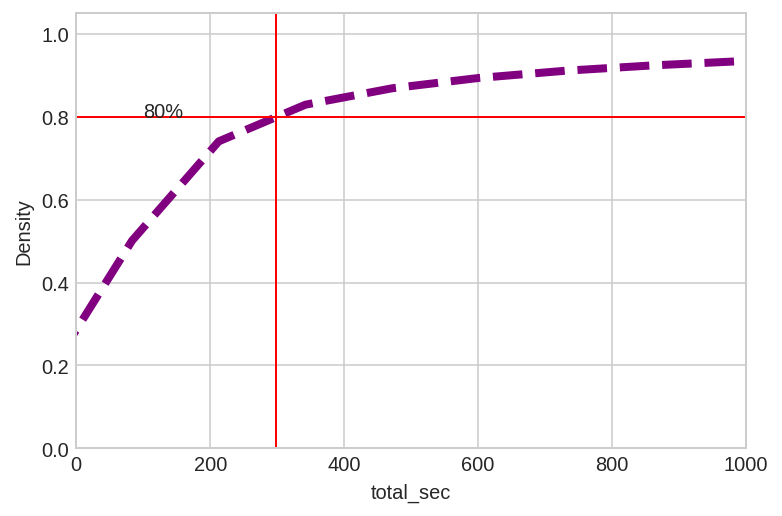

In [52]:
# kdeplot : kernel density estimation 
# density estimation(밀도추정) : (관측된) 데이터들의 분포로부터 원래 변수의 (확률) 분포 특성을 추정하고자 하는 것
# 그러나, 우리가 데이터에 대한 사전 정보를 아는 것은 거의 없기 때문에 사전 정보나 지식 없이 순수하게 관측된 데이터만으로 확률밀도함수를 추정해야 하는데 이를 non-parametric density estimation라 부른다.
# non-parametric density estimation의 대표적인 예가 히스토그램인데 히스토그램은 아래와 같이 3가지의 단점이 있다. 
# 1) bin의 경계에서 불연속성이 나타난다는 점, 
# 2) bin의 크기 및 시작 위치에 따라서 히스토그램이 달라진다는 점, 
# 3) 고차원(high dimension) 데이터에는 메모리 문제 등으로 사용하기 힘들다는 점 등의 문제점을 갖는다.
# 이러한 문제점을 해결하기 위한 그래프가 kdeplot이다. 
# 즉KDE(Kernel Density Estimation)를 통해 얻은 확률밀도함수는 히스토그램 확률밀도함수를 스무딩(smoothing)한 것이 kdeplot이다. 

plt.xlim(0,1000)
plt.text(100, 0.8, '80%')
sns.kdeplot(df1_action['total_sec'], cumulative=True, color = 'purple', linewidth=4, linestyle='--');
plt.axhline(0.8, linewidth = 1, color = 'red');
plt.axvline(299, linewidth = 1, color = 'red');

plt.show()

평균시간(299초)에 대한 kdeplot을 확인한 결과, 80%를 확인하였다. 

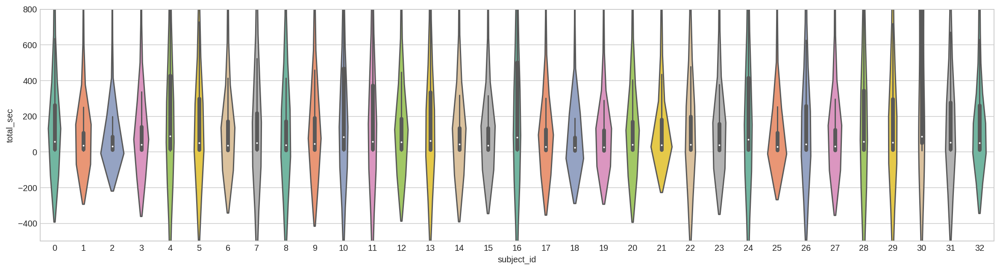

In [53]:
plt.figure(figsize=(20,5))

plt.ylim(-500,800)
sns.violinplot(x = 'subject_id', y='total_sec', data = df1_action.reset_index(), palette="Set2");

plt.show()

참여자별 사용시간에 대한 violinplot을 확인한 결과,  
0~200초 사이 다량의 데이터가 분포하는 것을 관측할 수 있었으며, 얇은 violin 모양을 대부분 관측할 수 있었습니다.   
이를 통해 참여자마다 특정한 앱에서 많은 시간을 소모하는 것이 아닌가 추측해볼 수 있었습니다.

In [54]:
# 일부 앱이 크롤링이 잘못되어 직접 수정을 진행하였습니다. 

# df1_action["genre"][df1_action.name.str.contains("Melon")] = "Music & Audio"
# df1_action["genre_bigcol"][df1_action.name.str.contains("Melon")] = "lifestype"

# df1_action["genre"][df1_action.name.str.contains("삼성 인터넷")] = "Productivity"
# df1_action["genre_bigcol"][df1_action.name.str.contains("삼성 인터넷")] = "producivity"

# df1_action["genre"][df1_action.name.str.contains("Chrome")] = "Productivity"
# df1_action["genre_bigcol"][df1_action.name.str.contains("Chrome")] = "producivity"

# df1_action["genre"][df1_action.name.str.contains("다음")] = "Productivity"
# df1_action["genre_bigcol"][df1_action.name.str.contains("다음")] = "producivity"

# df1_action["genre"][df1_action.name.str.contains("검은사막 모바일")] = "Role Playing"
# df1_action["genre_bigcol"][df1_action.name.str.contains("검은사막 모바일")] = "game"

# df1_action["genre"][df1_action.name.str.contains("YouTube")] = "Video"
# df1_action["genre_bigcol"][df1_action.name.str.contains("YouTube")] = "hobby"

In [55]:
top_ap = df1_action.groupby(['genre_bigcol','name'])['total_sec'].agg(['count','mean'])
top_ap['mean'] = top_ap['mean'].map(lambda x: time.strftime('%H:%M:%S', time.gmtime(x)))
top_ap.sort_values('count', ascending=False).head(10).groupby(level=0).head().sort_index(ascending=False)

count      mean
genre_bigcol     name                                 
tools            TouchWiz 홈             4607  00:06:30
                 Facebook               4693  00:03:51
social           트위터                    7223  00:02:42
self development Samsung Experience 홈  19199  00:05:39
                 ABC Platform           9157  00:05:16
lifestype        캐시워크                   8737  00:10:32
contact          카카오톡                  32331  00:03:24
                 삼성 인터넷                 4859  00:04:53
                 메시지                    4761  00:04:42
                 Chrome                 6386  00:03:55

In [56]:
top_ap[top_ap['count'] >= 100].sort_values('mean', ascending=False).head(10).groupby(level=0).head().sort_index()

count      mean
genre_bigcol name                                      
game         벽람항로                         473  00:12:23
hobby        AfreecaTV                    184  00:12:40
lifestype    CJ ONE                       258  00:16:47
             Mi 피트                        481  00:12:10
producivity  알람/시간                        126  00:37:01
             위베어베어스 더퍼즐                   169  00:13:14
tools        AhnLab V3 Mobile Security    204  00:12:30
             기본홈(홈&앱서랍)                   768  00:12:59
             시계                          1687  00:11:09
             알람/시계                        378  00:12:05

In [57]:
from collections import Counter

app_pt = Counter()
genre_pt = Counter()

a_pat = list(zip(set_df1_action['referrer_app'],set_df1_action['name']))
g_pat = list(zip(set_df1_action['referrer_genre'], set_df1_action['genre']))

app_pt.update(a_pat)
genre_pt.update(g_pat)

In [58]:
app_pt.most_common(10)

[(('Samsung Experience 홈', '카카오톡'), 9439),
 (('카카오톡', 'Samsung Experience 홈'), 5756),
 (('모아락', '캐시워크'), 2324),
 (('시스템 UI', '카카오톡'), 2273),
 (('허니스크린', '캐시워크'), 2064),
 (('ABC Platform', '카카오톡'), 2051),
 (('Samsung Experience 홈', 'NAVER'), 1989),
 (('Samsung Experience 홈', 'Instagram'), 1891),
 (('Samsung Experience 홈', '삼성 인터넷'), 1836),
 (('원더락', '캐시워크'), 1694)]

In [59]:
genre_pt.most_common(10)

[(('Business', 'Communication'), 14766),
 (('Personalization', 'Communication'), 12957),
 (('Communication', 'Business'), 7885),
 (('Communication', 'Communication'), 7113),
 (('Tools', 'Communication'), 5418),
 (('Personalization', 'Social'), 5297),
 (('Health & Fitness', 'Communication'), 4754),
 (('Business', 'Social'), 4734),
 (('Lifestyle', 'Health & Fitness'), 4347),
 (('Business', 'Tools'), 4209)]

In [60]:
genre_pt_1000 = genre_pt.most_common(100)

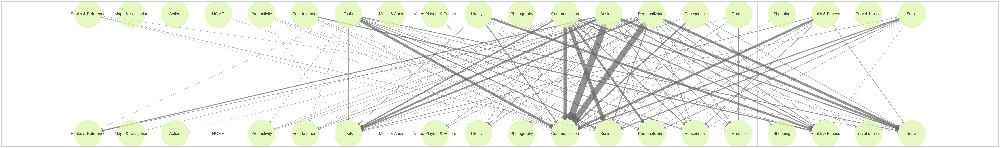

In [61]:
import networkx as nx
import numpy as np

plt.figure(figsize=(80,12))

G1_keys = set([k[0] for k, _ in genre_pt_1000 if all(k) is True])
G2_keys = set([k[1] for k, _ in genre_pt_1000 if all(k) is True])
G_keys = G1_keys.union(G2_keys)
num_keys = len(G_keys)
G_mapping = {k: v for v, k in enumerate(G_keys)}
G_rev_mapping = {k: v for k, v in enumerate(G_keys)}

edge_list = []
for edge, weight in genre_pt_1000:
    if all(edge) is False: continue
    mapped_edge = (G_mapping[edge[0]], G_mapping[edge[1]] + num_keys, weight)
    edge_list.append(mapped_edge)

node_labels = {k: v for k, v in G_rev_mapping.items()}
node_labels.update({k + num_keys: v for k, v in G_rev_mapping.items()})

DG = nx.DiGraph()

DG.add_weighted_edges_from(edge_list)
DG.add_nodes_from([k for k in G_rev_mapping.keys()])

pos = {}
for node in node_labels.keys():
    x_spacing = np.linspace(-0.8, 0.8, num_keys)
    x = x_spacing[node] if node < num_keys else x_spacing[node - num_keys]
    y = 0.5 if node < num_keys else -0.5
    pos[node] = (x, y)

edge_width = [DG[u][v]['weight'] for u, v in DG.edges()]
normalized_edge_width = [30 * width / max(edge_width) for width in edge_width]

plt.figure(1, figsize=(24, 8))
graph = nx.draw_networkx(DG, pos,
                         alpha=0.7,
                         with_labels=True, width=normalized_edge_width,
                         edge_color='.4', node_color = '#DAF7A6', node_size=15000, labels=node_labels, font_size = 18,
                         arrowstyle='->,head_width=0.6,head_length=0.5')

In [62]:
app_pt_100 = app_pt.most_common(100)

findfont: Font family ['NanumBarunGothic'] not found. Falling back to DejaVu Sans.


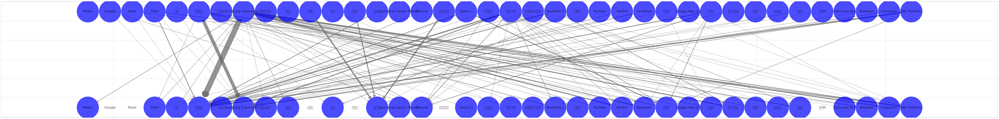

In [63]:
plt.figure(figsize=(100,12))

# zip으로 묶여있는 데이터에서 첫번째 앱과 두번째 앱을 각각 G1_keys과 G2_keys에 넣어주도록 하겠습니다. 
G1_keys = set([k[0] for k, _ in app_pt_100 if all(k) is True])
G2_keys = set([k[1] for k, _ in app_pt_100 if all(k) is True])

# dict G1_keys과 G2_keys을 하나로 통하해주도록 하겠습니다. 
G_keys = G1_keys.union(G2_keys)
num_keys = len(G_keys)
G_mapping = {k: v for v, k in enumerate(G_keys)}
G_rev_mapping = {k: v for k, v in enumerate(G_keys)}

edge_list = []
for edge, weight in app_pt_100:
  # edge는 앱 두개를 묶어놓은 것이고, 
  # weight는 몇번 이러한 숫자들이 있는지를 count한 값입니다. 
  if all(edge) is False: continue
  mapped_edge = (G_mapping[edge[0]], G_mapping[edge[1]] + num_keys, weight)
  edge_list.append(mapped_edge)

node_labels = {k: v for k, v in G_rev_mapping.items()}
node_labels.update({k + num_keys: v for k, v in G_rev_mapping.items()})

DG = nx.DiGraph()

DG.add_weighted_edges_from(edge_list)
DG.add_nodes_from([k for k in G_rev_mapping.keys()])

pos = {}
for node in node_labels.keys():
    x_spacing = np.linspace(-0.8, 0.8, num_keys)
    x = x_spacing[node] if node < num_keys else x_spacing[node - num_keys]
    y = 0.5 if node < num_keys else -0.5
    pos[node] = (x, y)

edge_width = [DG[u][v]['weight'] for u, v in DG.edges()]
normalized_edge_width = [30 * width / max(edge_width) for width in edge_width]

plt.figure(1, figsize=(24, 8))
graph = nx.draw_networkx(DG, pos,
                         alpha=0.7,
                         with_labels=True, width=normalized_edge_width,
                         edge_color='.4', node_color = 'blue', node_size=15000, labels=node_labels, font_size = 18,
                         arrowstyle='->,head_width=0.6,head_length=0.5', font_family="NanumBarunGothic")

findfont: Font family ['NanumBarunGothic'] not found. Falling back to DejaVu Sans.


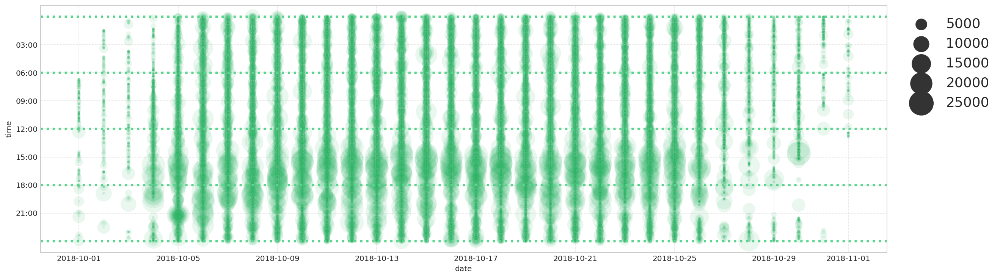

In [64]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
plt.rc('font', family='NanumBarunGothic') 
fig, ax = plt.subplots(figsize = (20,6))

pd.plotting.register_matplotlib_converters()

dt = df1_action.reset_index()[['date','time','total_sec','subject_id']]
# dt = dt.sort_values(by="date", ascending=True)
# dt["time"] = pd.to_datetime(dt["time"])

x = dt.date
y = dt.time
size = dt.total_sec
ytick = [f'{x}:00' for x in range(3,24,3)]
timepoints = ['00:01','06:00','12:00','18:00','23:59']

sns.scatterplot(x = x, y = y, size = size, sizes = (10,1000), alpha = 0.1, color = '#28B463')
plt.grid(True, alpha = 0.5, linestyle = '--')

# plt.xticks(fontsize = 15)
plt.yticks(ytick)

plt.legend(bbox_to_anchor=(1.01, 1), loc=2, prop={'size': 18})
for tp in timepoints: plt.axhline(tp, color = '#58D68D', linewidth = 3, linestyle = ':')
plt.show();

findfont: Font family ['NanumBarunGothic'] not found. Falling back to DejaVu Sans.


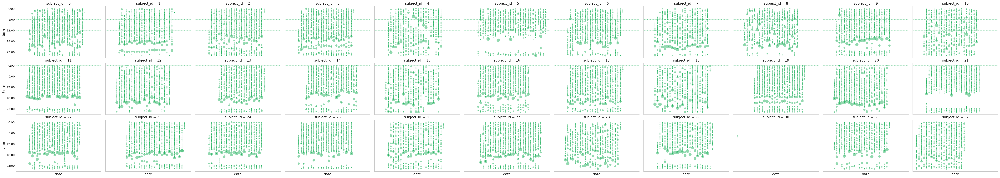

In [65]:
pd.plotting.register_matplotlib_converters()


dt = df1_action.reset_index()[['date','time','total_sec','subject_id']]

g = sns.FacetGrid(dt, col = 'subject_id', col_wrap = 11, aspect = 1.5)
g.map(sns.scatterplot, "date", "time", size = size, sizes = (5,150), color = '#28B463', alpha = 0.5)
ytick = [f'{x}:00' if x!= 24 else '23:00' for x in range(-6,25,6)]

plt.grid(True)
plt.xticks([])
g.fig.subplots_adjust(wspace=.05, hspace=.1)

for ax in g.axes.flat:
    ax.set_title(ax.get_title(), fontsize='large')
    ax.set_xlabel(ax.get_xlabel(), fontsize='large')
    ax.set_ylabel(ax.get_ylabel(), fontsize='large')
    ax.set_yticklabels(ytick, fontsize='medium')
    ax.grid(color='#28B463', linestyle=':', linewidth= 0.5)

findfont: Font family ['NanumBarunGothic'] not found. Falling back to DejaVu Sans.


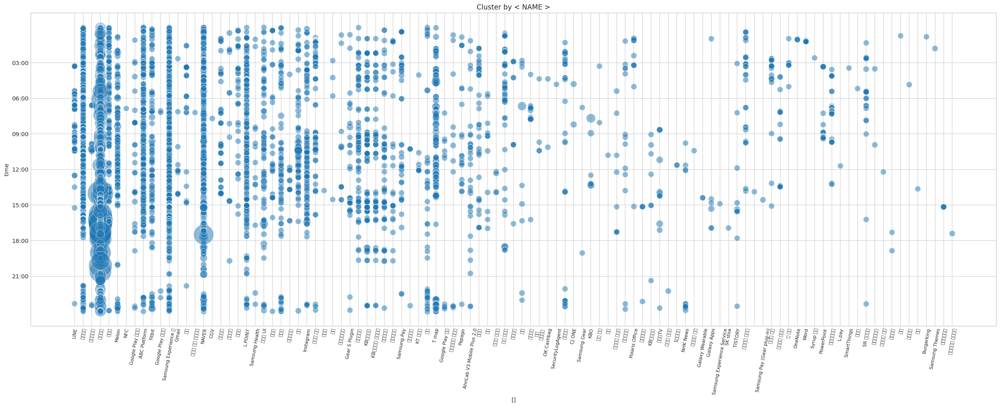

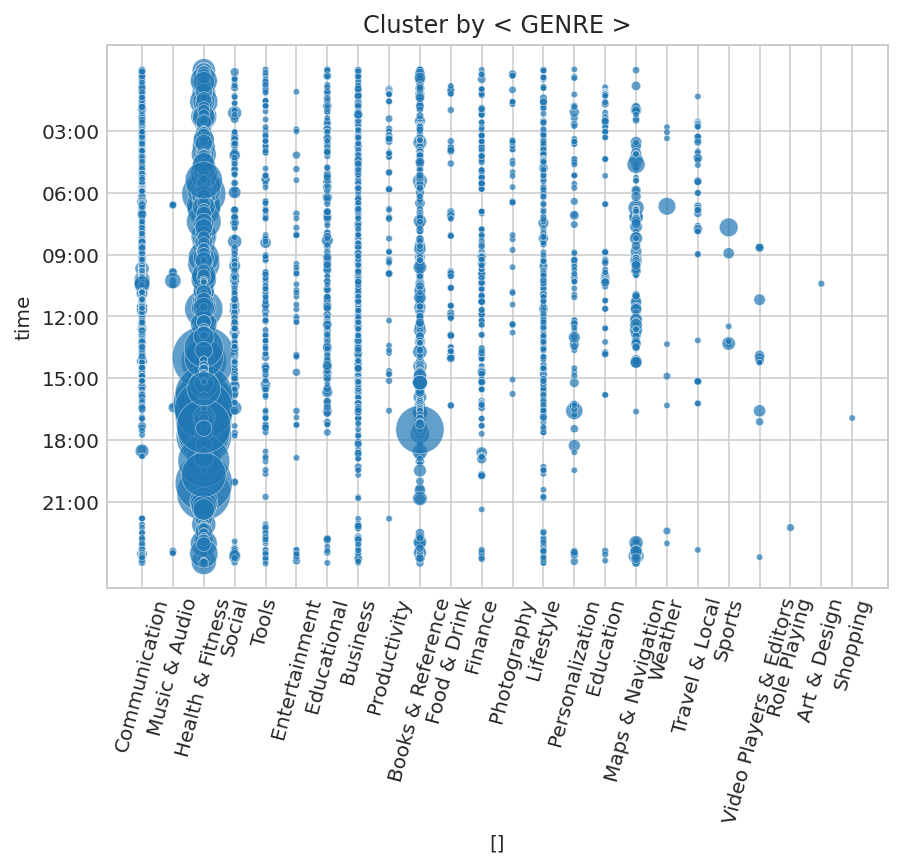

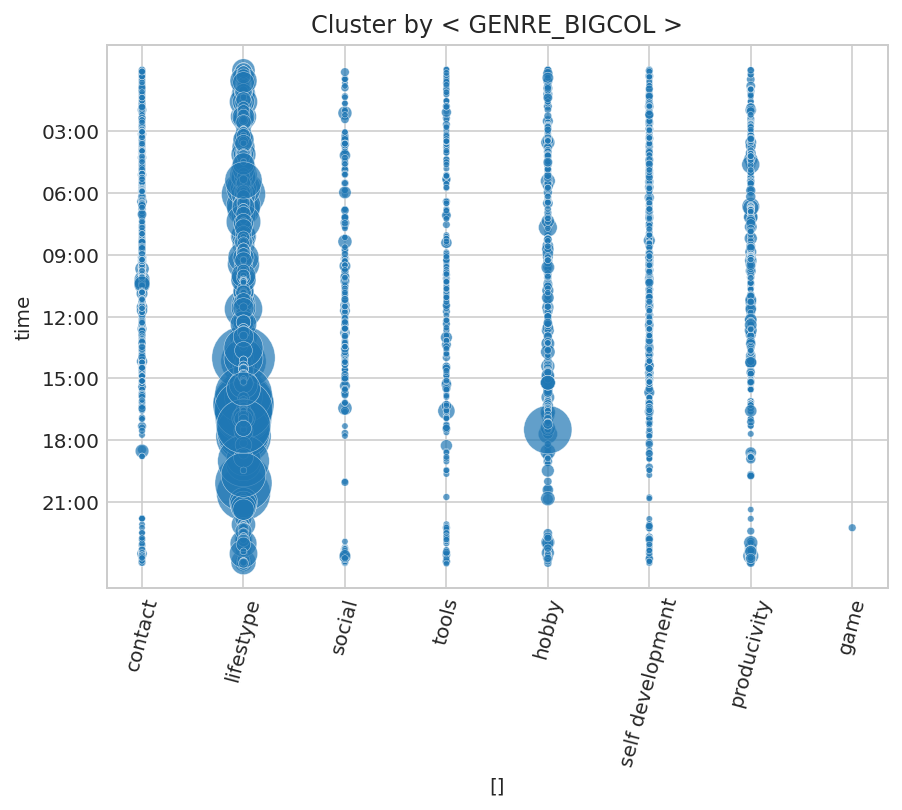

In [66]:
from matplotlib import rc
rc('font', family='NanumBarunGothic') 

pd.plotting.register_matplotlib_converters()

palette = sns.color_palette("Set2",4)
ytick = [f'{x}:00' for x in range(3,24,3)]

df = df1_action.loc[27]

for v in ['name','genre','genre_bigcol']:
    if v == 'name':
        plt.figure(figsize=(30,10));
        plt.xticks(rotation=80, fontsize=8);
        sns.scatterplot(x= v, y = 'time', size = 'total_sec', alpha = 0.5, sizes = (100,2000),
                        data=df, palette= palette, legend = False);
    else:
        plt.figure(figsize=(7,5));
        sns.scatterplot(x= v, y = 'time', size = 'total_sec', alpha = 0.7, sizes = (10,1000),
                        data=df, palette= palette, legend = False);
        plt.xticks(rotation=75)
        
    plt.yticks(ytick)
    plt.title(f'Cluster by < {v.upper()} >')
    plt.xlabel([])
    plt.show();

In [ ]:
fig = plt.figure(figsize=(60,9))
axes = fig.subplots(nrows=3, ncols=11)

handles = []
labels = df1_action.genre_bigcol.unique()

for i in range(33):
    col = i // 3
    row = i % 3
    
    df = df1_action.loc[i]
    g = sns.histplot(df, x='date', hue='genre_bigcol', ax= axes[row, col], legend = False);
    handles.append(g)

fig.legend(labels, loc="upper right", bbox_to_anchor=[0.935, 0.88], shadow=True, fancybox=True)

plt.show()

In [ ]:
my_freq = df1_action.groupby(['subject_id'])['name'].value_counts(normalize=True)
all_freq = df1_action['name'].value_counts(normalize=True)

def cal_importance(row):
    
    pid = row['subject_id']
    app_name = row['name']
    stay_time = row['total_sec']
    my_impt, all_impt = my_freq.loc[pid][app_name], all_freq[app_name]
    importance = round(my_impt / all_impt, 2)
    importance = importance*(stay_time/60) 
    return importance

In [ ]:
df1_action['importance'] = list(df1_action.reset_index().apply(cal_importance, axis=1))

In [ ]:
df1_action.importance.max()

In [ ]:
def importance_detector(rows):
    time = rows.total_sec
    importance = rows.importance
    
    if (time >= 300) & (importance > 3): return 4
    elif time >= 300: return 3
    elif importance > 3: return 2
    else: return 1

In [ ]:
df1_action['importance_cat'] = list(df1_action.apply(importance_detector, axis=1))

In [ ]:
pie_df = pd.DataFrame(df1_action.groupby('subject_id')['importance_cat'].value_counts(normalize=True)).sort_index(level=(0,1)).rename(columns = {'importance_cat':'ratio'})


fig = plt.figure(figsize=(33,9))
axes = fig.subplots(nrows=3, ncols=11)

handles = []
labels = df1_action.genre.unique()
pal = sns.color_palette("Set2", 4)

for i in range(33):
    col = i // 3
    row = i % 3
    
    df = pie_df.loc[i]
    axes[row,col].pie(df['ratio'], labels= df.index, startangle=90, counterclock=False, colors = pal,  autopct='%1.1f%%', textprops={'fontsize':10});
    axes[row,col].set_title(f'subject_id_{i}', fontsize=10)
    

plt.show()

In [ ]:
df1_action.groupby('importance_cat')['total_sec'].agg(['mean','count'])

In [ ]:
from matplotlib import rc
rc('font', family='NanumBarunGothic') 

pd.plotting.register_matplotlib_converters()

palette = sns.color_palette("Set2",4)
ytick = [f'{x}:00' for x in range(3,24,3)]

df = df1_action.loc[27]

for v in ['name','genre','genre_bigcol']:
    if v == 'name':
        plt.figure(figsize=(30,10));
        plt.xticks(rotation=90, fontsize=8);
        sns.scatterplot(x= v, y = 'time', size = 'total_sec', hue='importance_cat', alpha = 0.5, sizes = (100,2000),
                        data=df, palette= palette, legend = False);
    else:
        plt.figure(figsize=(7,5));
        sns.scatterplot(x= v, y = 'time', size = 'total_sec', hue='importance_cat', alpha = 0.7, sizes = (10,1000),
                        data=df, palette= palette, legend = False);
        plt.xticks(rotation=90)
        
    plt.yticks(ytick)
    plt.title(f'Cluster by < {v.upper()} >')
    plt.xlabel([])
    plt.show();

In [ ]:
train = df1_action.reset_index()[['subject_id','name','is_system_app','genre','genre_bigcol', 'time','referrer_package','referrer_app','referrer_genre','total_sec','importance_cat']]
train.dropna(inplace = True)



In [ ]:
#시계열 data, 이후의 데이터를 예측

val_len = int(len(train)*0.1)
target = ['genre_bigcol'] #다음으로 올 genre는?

y_train = train[target]
x_train = train.drop(target, axis = 1)

x_val = x_train.iloc[(val_len)*-2:]
y_val = y_train.iloc[(val_len)*-2:]

x_train = x_train.drop(x_val.index)
y_train = y_train.drop(y_val.index)

In [ ]:
x_train.shape, y_train.shape, x_val.shape, y_val.shape

In [ ]:
!pip install category_encoders

In [ ]:
import category_encoders
from category_encoders import OrdinalEncoder
from sklearn.pipeline import make_pipeline
from sklearn.metrics import classification_report
from lightgbm import LGBMClassifier, LGBMRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.multioutput import MultiOutputClassifier

In [ ]:
pipe = make_pipeline(
    OrdinalEncoder(),
    MultiOutputClassifier(LGBMClassifier(
                                        objective = 'multiclass', # 다중클래스 분류를 위해 multiclass 선정 
                                        metric = 'multi_logloss' # # 다중클래스 분류를 위해 multi_logloss 선정  
                                        ))
)

In [ ]:
pipe.fit(x_train, y_train)

In [ ]:
y_pred = pipe.predict(x_val)

In [ ]:
## 전체 predict
print(classification_report(y_val, y_pred))

# 추가(사유, Result)

#### XGBRegressor
사용자 어플리케이션을 얼마나 이용했는지 시간을 예측하는 모델링을 구성해보았습니다. 


- Target
  - totel_sec(총 사용시간 / 단위 : 초)
  - 어플리케이션 사용 시간 예측해보고자 함 

- Scoring 
  - 성능 : 1% 
  - 측정지표 : neg_mean_absolute_percentage_error
  - 사유 : 오차를 비율단위로 측정하기 위해서 

- Train:
  - hold out validation 방식으로 Train / val / test 나누어 검증 진행 
  - (train_test_split은 시계열 특성으로 사용불가 )

- Model
  - type : lightGBMRegressor 
  - 사유 :  공부하고 나서 기재하자..

---

- Result:
    - Weighted Average 0.27
    - p_id별로 나누어 따로따로 모델을 돌리면 정확도가 0.40 정도까지 올라가는 것으로 보아 모델 자체에서 pid를 구분해 개인의 취향과 패턴을 제대로 익히지는 못하는 것으로 보임.

In [ ]:
train = df1_action.reset_index()[['subject_id','name','is_system_app','time','genre','genre_bigcol','referrer_package','referrer_app','referrer_genre','importance_cat', 'total_sec']]
train.dropna(inplace = True)

In [ ]:
from xgboost import XGBRegressor
from sklearn.multioutput import MultiOutputRegressor, RegressorChain
from sklearn.model_selection import train_test_split
from lightgbm import LGBMRegressor

pipe = make_pipeline(
    OrdinalEncoder(),
    LGBMRegressor(
    )   
)

In [ ]:
val_len = int(len(train)*0.1)
target = 'total_sec' #다음으로 올 genre는?

y_train = train[target]
X_train = train.drop(target, axis = 1)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

# xgboost ValueError: feature_names mismatch 해결하기 위한 코드 
X_train = np.asmatrix(X_train)
X_val = np.asmatrix(X_val)

In [ ]:
val_len*-2

In [ ]:
y_train = train[target]
x_train = train.drop(target, axis = 1)

x_val = x_train.iloc[(val_len)*-2:] # 시계열 데이터이므로 뒤어서부터 순차적으로 가져오기 위한 코드 
y_val = y_train.iloc[(val_len)*-2:]

x_train = x_train.drop(x_val.index)
y_train = y_train.drop(y_val.index)

In [ ]:
# X_train.shape, y_train.shape, X_val.shape, y_val.shape
x_train.shape, y_train.shape, x_val.shape, y_val.shape

In [ ]:
pipe.fit(x_train,y_train)

In [ ]:
y_pred = pipe.predict(x_val)

In [ ]:
!pip install scikit-learn==0.24

In [ ]:
from sklearn.model_selection import cross_val_score
import sklearn.metrics

k = 10 # 3-fold 교차검증을 수행
scores = cross_val_score(pipe, x_train, y_train, cv=k, 
                         scoring='neg_mean_absolute_percentage_error') #evaluation metrics 설정

## 본래 사용 시간이 300분인 것을 310분으로 예상하는 것과, 1초만에 끝날 것을 1분이라 예상하는 것은 엄연히 다르다.
## 이에 크기 기반이 아닌, 비율을 기반으로 한 예측이 필요 -> neg_mean_absolute_percentage_error로 선정


In [ ]:
-scores

In [ ]:
-scores.mean()

In [ ]:
from sklearn.model_selection import cross_val_score

k = 10 # 3-fold 교차검증을 수행
scores = cross_val_score(pipe, x_val, y_val, cv=k, 
                         scoring='neg_mean_absolute_percentage_error') #evaluation metrics 설정

# 시계열 데이터를 다루고 있는 상황이기에 
# 5분에서 1분 오차와 30분에서 1분 오차는 매우 다른 의미를 결론을 도출하게 된다. 
# 이에, 값의 크기보다 비율적인 scoring이 필요하다고 생각하였고, neg_mean_absolute_percentage_error를 scoring으로 설정하게 되었습니다. 


In [ ]:
-scores #오차범위 6~7.5% 사이를 기록하며 꽤 좋은 성능을 보임

In [ ]:
-scores.mean()

In [ ]:
from sklearn.model_selection import cross_validate
cv_result = cross_validate(pipe, x_train, y_train, cv=k,
                            scoring='neg_mean_absolute_percentage_error',
                            return_estimator=True)
# return_estimator의 feault는 False 입니다. / True로 설정하면 각각 cv에 대한 내용이 객체로 출력이 되게 됩니다. 
# 아래에 cv_result['estimator']를 reg_fit로 저장하기위해 return_esitmator를 사용합니다. 

In [ ]:
-cv_result['test_score'].mean()

In [ ]:
reg_fit = cv_result['estimator']
len(reg_fit) #3cross validation이니까 3개여야함

In [ ]:
reg_fit

In [ ]:
%store reg_fit

# Deep Learning

- 목적: 각 소비자별 선호 + 어플리케이션 사용 패턴을 바탕으로 각 소비자가 다음에 사용할 ‘어플리케이션 명’를 예측하는 것.<br/>(딥러닝 모델의 경우 대장르 예측은 물론이고, 전반적으로 압도적으로 뛰어난 성능을 보였기 때문에 보다 어려운 태스크를 요구해 봄)

- Baseline Model Accuracy: 1 / 693 *100 = 0.001 (어플리케이션은 모두 693개)

- TRAIN:    
    - Feature: 개인ID, 사용 어플리케이션명, 어플리케이션 장르, 행위 그룹(1,2,3,4), 시간, 사용 시간대, Referrer(현재 어플리케이션으로 이동하기 전에 사용한) 어플리케이션명,  Referrer 장르, Referrer 패키지
    - Target: 사용 어플리케이션명

- MODEL: 훈련 데이터를 벡터화, 이를 임베딩 층에 가중치로 주입하고, LSTM 사용.

- TEST:
- 미래 사용할 어플리케이션을 예측할 때에는 어플리케이션을 알 지 못하므로 그 행위가 어떤 그룹에 속할지를 알 수는 없음.
- 이에, 관심도를 주지 않은 상태로 예측을 시켜 봄. (딥러닝 신경망 모델에서는 인풋 Shape가 모델이 구성된 Shape와 정확히 일치하지 않아도 예측이 가능했었음)

- Result:
    - weighted average 0.75
    - 갯수가 적은 클래스에 대해서는 예측력이 떨어지나, 충분한 기록이 있는 클래스에 대해서는 좋은 성능을 보임
    - 테스트 셋에서 각 행위가 해당하는 중요도 그룹을 말해주지 않더라도, 이미 모델은 훈련과정에서 개인들의 취향, 패턴을 파악했기에 다음과 같은 좋은 accuracy를 낼 수 있었던 것으로 보임

In [ ]:
import tensorflow as tf

In [ ]:
data = df1_action.reset_index()[["subject_id",	"name",	"is_system_app",	"type",	"genre",	"referrer_package",	"referrer_app",	"referrer_genre",	"total_sec", "importance_cat"]]

In [ ]:
data.head(2)

In [ ]:
data.shape

In [ ]:
encoder = OrdinalEncoder()
encoded_data = encoder.fit_transform(data)
encoded_data.dtypes

In [ ]:
encoded_data.head(2)

In [ ]:
target = ['name']

In [ ]:
X_train = encoded_data.drop(target, axis=1).to_numpy()
y_train = encoded_data[target]
X_train.shape, y_train.shape

# ~


In [ ]:
from tensorflow.keras.utils import to_categorical
y_train = y_train - 1 #to_categorical은 0부터 시작인데 우리의 타겟은 1부터 인코딩됨 -> 1 빼주기

y_train = to_categorical(y_train)
print(y_train)

In [ ]:
from sklearn.model_selection import train_test_split
X_train, x_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=2)

In [ ]:
X_train.shape, x_val.shape, y_train.shape, y_val.shape

# ~


In [ ]:
tf.random.set_seed(1023)

model = tf.keras.Sequential([
    tf.keras.layers.Embedding(len(X_train), 238, input_length = 10),
    tf.keras.layers.Dense(256, activation='relu'),
    tf.keras.layers.LSTM(256, dropout=0.2, recurrent_dropout=0.2),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(738, activation='softmax')
              ]) 


checkpoint_filepath = "FMbest.hdf5"

early_stop = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', min_delta=0, patience=3, verbose=1)

save_best = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath, monitor='val_accuracy', verbose=1, save_best_only=True,
    save_weights_only=True, mode='auto', save_freq='epoch', options=None)


model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

model.fit(X_train, y_train,
          batch_size= 32,
          validation_split= 0.2,
          callbacks= [early_stop, save_best],
          epochs= 200)

model.summary()

# ~


In [ ]:
x_val = np.delete(x_val,-1,1) #importance_cat(마지막 value)를 지워줌
x_val

In [ ]:
y_pred = model.predict(x_val)

In [ ]:
import numpy as np
predicted_categories = np.argmax(y_pred, axis = 1)
predicted_categories[:2]

In [ ]:
true_categories = tf.concat([[y for y in y_val]], axis = 0).numpy()
true_categories[:2]

In [ ]:
true_categories_argmax = np.argmax(true_categories, axis = 1)
true_categories_argmax[:2]

In [ ]:
print(classification_report(true_categories_argmax, predicted_categories))

In [ ]:
df1_action["name"][df1_action.name.str.contains("토스")]

In [ ]:
# 토스를 사용는 프로젝트 참여자 ( 18/33 )
# 해당 참여자들만 가지고 분석을 진행해보겠습니다. 
len([3, 6, 7, 8, 9,11,12,15,17,18,20,22,23,24,26,27,31,32])